Neural Radiance Fields (NeRF)

This notebook explains how NERFs work in theory and in practice with a code that can be executed with or without a GPU. We strongly advise the reader to look at the readme before continuing. The original paper introducing NERFs from Ben Mildenhall et al can be found [here](https://arxiv.org/abs/2003.08934). The code is ? . 


The notebook is organized as follows:

1. **What can a NeRF do ?**  
   What is a NERF in 2 sentences and 1 gif

2. **Representing a 3D Scene with a NeRF**  
   How to represent a 3D scene with a Neural Radiance Field representation

3. **Rendering from a NeRF Representation**  
   How to render from a learned NERF representation ?

4. **Key Improvements to Neural Radiance Fields**  
   - **Positional Encoding:** Enables the network to capture high-frequency details.  
   - **Hierarchical Volume Sampling:** Improves rendering efficiency and quality.

5. **How to train a NeRF ?**  
   How to theorically train a NeRF representation

5. **Practical implementation and experiments**  
   Implementation with details and presentation of results from experiments.


## 1: What can a NeRF do ?
A Neural Radiance Fields model is a model introduced by Ben Mildenhall et al that is able to generate photorealistic new views of a 3D scene from a few images of this scene. You can see an example of 120 views generated from 20 images taken from different angles using this notebook.

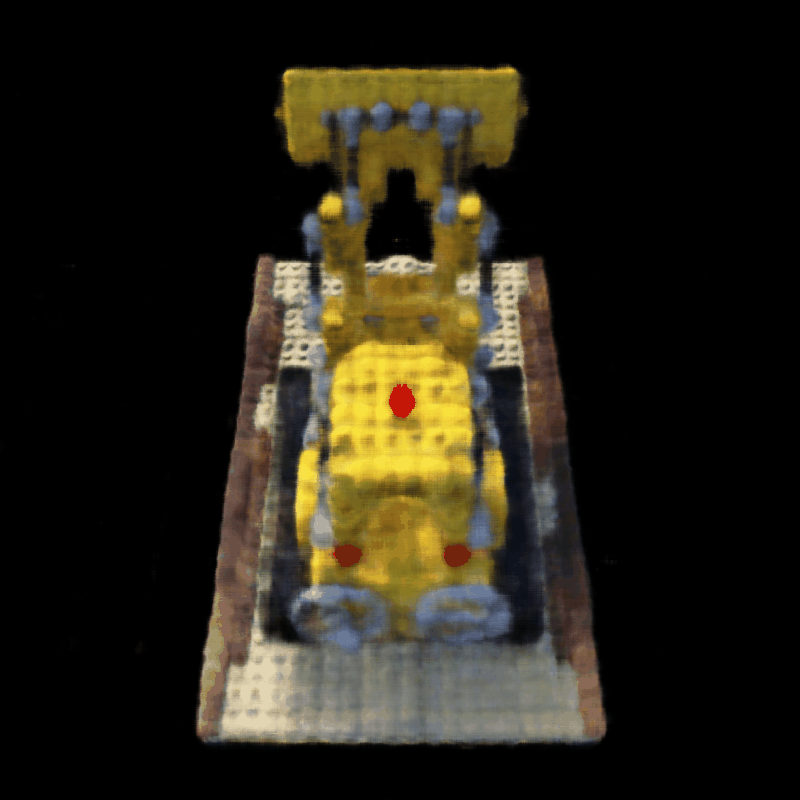

In [3]:
from IPython.display import Image

# Display the GIF
Image(filename='results_for_notebook/novel_views_lego_multi_20views_100000iter_120newviews_400imdim_cuda.gif')

## 2: Representing 3D Scene with a NeRF

A NeRF is a function that takes as input the coordinates of a point **x** = (x,y,z) and a direction (θ,\phi ) and outputs the volume densitiy σ at the point **x** and a color **c**=(r,g,b) emitted by the points **x** in the direction (\theta,\phi). In practice, we do not use angles (\theta,\phi) but we give the direction by a 3D cartesian unit vector **d**. So, we can write that a NeRF parametrised by \theta is F_θ : (**x**,**d**) → (**c**,\sigma) where F_θ will be a very simple MLP.

For a given point **x**, the volume density should always be the same when we change the direction from where we look at it. To enforce this, the authors make the MLP F_θ process only **x** and output σ and a 256 dimensional feature vector that will be passed to an additional fully connected layer  that will output the color **c**. 

It is important to note that with this setup, the outputed color **c** does depend on the angle from where we look at point **x**. This is realistic because for many objects, a point looks different when we look at it from different angles. The object that verifies this property are called non-Lambertian and include polished metal surfaces or water. An object that reflects light equally in all directions is called Lambertian. NeRFs supports non-Lambertian objects ! 


## 3: Rendering from a NeRF Representation


![NeRF architecture diagram](results_for_notebook/schema_fig2_article.png)





For the moment we suppose that we are given access to a NeRF representation $F_\theta$ of a 3D scene and we want to generate 2D views of the 3D scene using $F_\theta$.

# Pinhole camera hypothesis
NeRF models make the pinhole camera assumption. In other words, we assume that each pixel in the image corresponds to one and only one ray. To synthesize a 2D view of the 3D scene we apply the following process to each pixel:
1. We cast a ray **r**(t)= **o** +t**d** from the pinhole of the camera **o**,  going into the 3D scene by varying the value of $t$, where **d** is the direction associated with the pixel. The pixel determines **d**, the direction of the ray. This is what we see on the figure (a) of the figure just above.
2. Compute the expected color of the ray and take it as the pixel value.



# What is the expected color of a ray ?
Suppose that we are given a pixel and a camera position or equivalently we are given **r**(t)= **o** +t**d**. The expected color of this ray is defined by the following equation :

$$
C(\mathbf{r}) = \int_{t_n}^{t_f} T(t) \, \sigma(\mathbf{r}(t)) \, c(\mathbf{r}(t), \mathbf{d}) \, dt, 
\quad \text{where} \quad 
T(t) = \exp\left( - \int_{t_n}^{t} \sigma(\mathbf{r}(s)) \, ds \right). \tag{1}
$$


Let's break down each term of equation (1).

$T(t) = \exp\left( - \int_{t_n}^{t} \sigma(\mathbf{r}(s)) \, ds \right)$ is the probability that the ray has fully survided until time t (i.e reaching position **r**(t)). More precisely, it is the accumulated transmittance, i.e the probability that the ray did not hit any other particle between $t_n$ and $t$.

$\sigma(\mathbf{r}(t))$ is the volume density and represents the instantaneous probability per unit length that the ray is absorbed at time t (i.e absorbed at position **r(t)**). 

So the integrand in C(**r**) can be understood as the multiplication of the probability to have survived until t 
times the instantaneous probability of dying at **r**(t) times the color emitted by the point at **r**(t) in direction **d**.




# In practice we need to approximate the expected color of a ray
The integral $C(\mathbf{r})$ needs to be approximated. 
1. We first need to pick time steps $t ∈ [t_n, t_f]$. The authors DO NOT make a deterministic choice for $t$ because it will limit the NeRF will always be queried at a fixed locations. They divide the segment $[t_n, t_f]$ into N evenly-spaced bins and they uniformaly sample one $t_i$ from each bin. The authors argue that this sampling technique enables a continuous representation of the scene.

2. Use the quadrature 


$$
\hat{C}(\mathbf{r}) = \sum_{i=1}^{N} T_i \left(1 - \exp(-\sigma_i \delta_i) \right) c_i,
\quad \text{where} \quad 
T_i = \exp\left( - \sum_{j=1}^{i-1} \sigma_j \delta_j \right). \tag{3}
$$

where $\delta_i = t_{i+1} - t_i$ is the distance between adjacent samples.

The quantities $\mathbf{c}_i$ and $\sigma_i$ are provided by $F_\Theta$ evaluated in $(\mathbf{r}(t_i),\mathbf{d})$.

This approximation is often rewritten 
$$
\hat{C}(\mathbf{r}) = \sum_{i=1}^{N} T_i \, \alpha_i \, c_i,$$ 

where $\alpha_i = 1 - \exp(-\sigma_i \delta_i)$ is how much opacity there is in the segment $i$.




## 4: Key improvements to Neural Radiance Fields

# Positional encoding 

The authors project the data in higher dimension using high frequency functions before passing it to neural networks. This enables neural networks to learn high-frequency variations and is necessary because neural networks tend to be biased to learn lower frequency functions. Without positional encoding, we will not be able to get fine details in the 3D scene.
They redefine $F_\theta$ as $F_\theta' ∘ \gamma$, where $\gamma : \mathbb{R} \rightarrow \mathbb{R}^L$ is defined by 
$$
\gamma(p) = \left( \sin(2^0 \pi p), \cos(2^0 \pi p), \cdots, \sin(2^{L-1} \pi p), \cos(2^{L-1} \pi p) \right). \tag{4}
$$

$\gamma$ is separately applied to each of the 3 coordinates of **x** and each of the 3 coordinates of **d**. The authors chose $L=10$ for **x** and $L=4$ for **d**.

Remarks : 
1. $F_\theta'$ is the 'old' $F_\theta$.
2. The notation of the authors $F_\theta' ∘ \gamma$ can be confusing and lack rigour but we keep it to be consistent with the notations of the authors. 




# Hierarchical Volume Sampling

To compute the approximation $\hat{C}(\mathbf{r})$ of $C(\mathbf{r})$ that is the expected ray color (i.e also the pixel color) we sampled $t_i$ uniformaly within equal size bins. Remember that $t_i$ defines where we will evaluate our neural network to output color and density. This method of sampling $t_i$ is highly inefficient since we might sample at places that will not contribute to the color because they represent empty space or occluded regions. To avoid this, the authors use 2 networks, a 'coarse' network that will sample $t_i$ as before and explore the ray to see where are the most important regions. Then, a 'fine' network will sample other $t_i$ with a distribution biased towards the most important regions found by the 'coarse network'. 

Here is the procedure in more details :

1. Sample $N_c$ $t_i$ with the naive procedure described before.
2. Compute the approximation $$\hat{C}_c(\mathbf{r}) = \sum_{i=1}^{N_c} w_i \, c_i, \quad \quad w_i = T_i \left(1 - \exp(-\sigma_i \delta_i) \right). \tag{5} $$
3. Normalise the weights $\hat{w}_i = \dfrac{w_i}{\sum_{j=1}^{N_c} w_j}$, this creates a discrete probability distribution function over the coarse sample points.
4. Transform this discrete distribution into a piecewise-constant PDF by assuming the probability density is constant between each pair of coarse samples.
5. Sample $N_f$ other $t_i$ by using the inverse CDF sampling technique using the distribution of step 4.
6. Compute the approximation using the $N_c + N_f$ $t_i$:  $$\hat{C}_f(\mathbf{r}) = \sum_{i=1}^{N_c+N_f} w_i \, c_i, \quad \quad w_i = T_i \left(1 - \exp(-\sigma_i \delta_i) \right). \tag{5} $$





## 5: Training a NeRF representation

Up to this point, we supposed that we have to access to a trained network $F_\theta$. Now, we will see how to actually train the networks we need.

The approximations $\hat{C_c}(\mathbf{r})$ and $\hat{C_f}(\mathbf{r})$ are fully differentiable, which allows us to use gradient descent to optimize network parameters. 

Here is the procedure in more detail, for each optimisation iteration:
1. Randomly sample a batch of camera rays corresponding to pixels in the training set.
2. Follow the hierarchichal sampling procedure described above
3. Compute the following loss : $$\mathcal{L} = \sum_{\mathbf{r} \in \mathcal{R}} \left[ \left\| \hat{C}_c(\mathbf{r}) - C(\mathbf{r}) \right\|_2^2 + \left\| \hat{C}_f(\mathbf{r}) - C(\mathbf{r}) \right\|_2^2 \right]. \tag{6}$$
4. Perform a gradient descent step to update networks parameters

Remarks : 
1. At inference time, only the 'fine' network will be used. However, we also include the 'coarse' network in the loss because we want it to learn to output meaningful weights that will be used by the 'fine' network when performing hierarchical sampling.
2. A trained model can only be used for a specific 3D scene. If we want to sample new views from an other 3D scene we must train an other model from scratch, there is no transfer of knowledge between scenes.
3. To achieve photorealistic results, the authors trained their model for 1-2 days on a single NVIDIA V100 GPU. There are more recent methods achieving very fast training but I will not talk about those in this notebook. Here is a link to a blog post from Frank Dellaert repertoring many NeRFs variants with some achieving 5000 times faster training than the basic NeRF. https://dellaert.github.io/NeRF22/ .


## 5 Practical implementation and experiments

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import imageio.v3 as iio
import os

# Use GPU is available and CPU otherwise
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

Ray generating function

In [ ]:
def get_rays(H, W, focal, c2w):
    """Generate rays for each pixel in the image."""
    # Create pixel coordinates
    i, j = torch.meshgrid(torch.arange(W, dtype=torch.float32, device=device),
                          torch.arange(H, dtype=torch.float32, device=device),
                          indexing='xy')

    # Convert pixel coordinates to camera coordinates
    dirs = torch.stack([(i - W * 0.5) / focal,
                        -(j - H * 0.5) / focal,
                        -torch.ones_like(i)], dim=-1)

    # Rotate directions from camera frame to world frame
    rays_d = torch.sum(dirs[..., None, :] * c2w[:3, :3], -1)

    # Translate camera frame origin to world frame origin
    rays_o = c2w[:3, -1].expand(rays_d.shape)
    return rays_o, rays_d